## About Data

**Description about each column in dataset**

*Train Data*
- PassengerId : A unique Id for each passenger. Each Id takes the form gggg_pp where gggg indicates a group the passenger is travelling with and pp is their number within the group. People in a group are often family members, but not always.
- HomePlanet : The planet the passenger departed from, typically their planet of permanent residence.
- CryoSleep : Indicates whether the passenger elected to be put into suspended animation for the duration of the voyage. Passengers in cryosleep are confined to their cabins.
- Cabin : The cabin number where the passenger is staying. Takes the form deck/num/side, where side can be either P for Port or S for Starboard.
- Destination : The planet the passenger will be debarking to.
- Age : The age of the passenger.
- VIP : Whether the passenger has paid for special VIP service during the voyage.
- RoomService, FoodCourt, ShoppingMall, Spa, VRDeck : Amount the passenger has billed at each of the Spaceship Titanic's many luxury amenities.
- Name : The first and last names of the passenger.
- Transported : Whether the passenger was transported to another dimension. This is the target, the column you are trying to predict.

*Test Data*
- Personal records for the remaining one-third (~4300) of the passengers, to be used as test data. Your task is to predict the value of Transported for the passengers in this set.

*sample_submission.csv*
 A submission file in the correct format.
- PassengerId : Id for each passenger in the test set.
- Transported : The target. For each passenger, predict either True or False.

# Import Module & Data

In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline

%timeit

-------

-------

## Define Data

In [2]:
train_data = pd.read_csv("train.csv")
test_data = pd.read_csv("test.csv")
sample = pd.read_csv("sample_submission.csv")

-------

In [3]:
train_data.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True


In [4]:
train_data.columns

Index(['PassengerId', 'HomePlanet', 'CryoSleep', 'Cabin', 'Destination', 'Age',
       'VIP', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck',
       'Name', 'Transported'],
      dtype='object')

In [5]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8492 non-null   object 
 2   CryoSleep     8476 non-null   object 
 3   Cabin         8494 non-null   object 
 4   Destination   8511 non-null   object 
 5   Age           8514 non-null   float64
 6   VIP           8490 non-null   object 
 7   RoomService   8512 non-null   float64
 8   FoodCourt     8510 non-null   float64
 9   ShoppingMall  8485 non-null   float64
 10  Spa           8510 non-null   float64
 11  VRDeck        8505 non-null   float64
 12  Name          8493 non-null   object 
 13  Transported   8693 non-null   bool   
dtypes: bool(1), float64(6), object(7)
memory usage: 891.5+ KB


-------

In [6]:
test_data.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name
0,0013_01,Earth,True,G/3/S,TRAPPIST-1e,27.0,False,0.0,0.0,0.0,0.0,0.0,Nelly Carsoning
1,0018_01,Earth,False,F/4/S,TRAPPIST-1e,19.0,False,0.0,9.0,0.0,2823.0,0.0,Lerome Peckers
2,0019_01,Europa,True,C/0/S,55 Cancri e,31.0,False,0.0,0.0,0.0,0.0,0.0,Sabih Unhearfus
3,0021_01,Europa,False,C/1/S,TRAPPIST-1e,38.0,False,0.0,6652.0,0.0,181.0,585.0,Meratz Caltilter
4,0023_01,Earth,False,F/5/S,TRAPPIST-1e,20.0,False,10.0,0.0,635.0,0.0,0.0,Brence Harperez


In [7]:
test_data.columns

Index(['PassengerId', 'HomePlanet', 'CryoSleep', 'Cabin', 'Destination', 'Age',
       'VIP', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck',
       'Name'],
      dtype='object')

In [8]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4277 entries, 0 to 4276
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   4277 non-null   object 
 1   HomePlanet    4190 non-null   object 
 2   CryoSleep     4184 non-null   object 
 3   Cabin         4177 non-null   object 
 4   Destination   4185 non-null   object 
 5   Age           4186 non-null   float64
 6   VIP           4184 non-null   object 
 7   RoomService   4195 non-null   float64
 8   FoodCourt     4171 non-null   float64
 9   ShoppingMall  4179 non-null   float64
 10  Spa           4176 non-null   float64
 11  VRDeck        4197 non-null   float64
 12  Name          4183 non-null   object 
dtypes: float64(6), object(7)
memory usage: 434.5+ KB


-------

In [9]:
sample.head()

,PassengerId,Transported
0,0013_01,False
1,0018_01,False
2,0019_01,False
3,0021_01,False
4,0023_01,False


-----------

## Checking Data

In [10]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8492 non-null   object 
 2   CryoSleep     8476 non-null   object 
 3   Cabin         8494 non-null   object 
 4   Destination   8511 non-null   object 
 5   Age           8514 non-null   float64
 6   VIP           8490 non-null   object 
 7   RoomService   8512 non-null   float64
 8   FoodCourt     8510 non-null   float64
 9   ShoppingMall  8485 non-null   float64
 10  Spa           8510 non-null   float64
 11  VRDeck        8505 non-null   float64
 12  Name          8493 non-null   object 
 13  Transported   8693 non-null   bool   
dtypes: bool(1), float64(6), object(7)
memory usage: 891.5+ KB


In [11]:
train_data.isnull().sum()

PassengerId       0
HomePlanet      201
CryoSleep       217
Cabin           199
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Name            200
Transported       0
dtype: int64

In [12]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4277 entries, 0 to 4276
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   4277 non-null   object 
 1   HomePlanet    4190 non-null   object 
 2   CryoSleep     4184 non-null   object 
 3   Cabin         4177 non-null   object 
 4   Destination   4185 non-null   object 
 5   Age           4186 non-null   float64
 6   VIP           4184 non-null   object 
 7   RoomService   4195 non-null   float64
 8   FoodCourt     4171 non-null   float64
 9   ShoppingMall  4179 non-null   float64
 10  Spa           4176 non-null   float64
 11  VRDeck        4197 non-null   float64
 12  Name          4183 non-null   object 
dtypes: float64(6), object(7)
memory usage: 434.5+ KB


In [13]:
test_data.isnull().sum()

PassengerId       0
HomePlanet       87
CryoSleep        93
Cabin           100
Destination      92
Age              91
VIP              93
RoomService      82
FoodCourt       106
ShoppingMall     98
Spa             101
VRDeck           80
Name             94
dtype: int64

Columns in Train and Test has many null values

-----------

## Clean the Data

In [14]:
#filling null values with mean in numerical columns

train_data['Age']=train_data['Age'].fillna(train_data['Age'].mean())
train_data['RoomService']=train_data['RoomService'].fillna(train_data['RoomService'].mean())
train_data['FoodCourt']=train_data['FoodCourt'].fillna(train_data['FoodCourt'].mean())
train_data['ShoppingMall']=train_data['ShoppingMall'].fillna(train_data['ShoppingMall'].mean())
train_data['Spa']=train_data['Spa'].fillna(train_data['Spa'].mean())
train_data['VRDeck']=train_data['VRDeck'].fillna(train_data['VRDeck'].mean())

#filling null values with mode in categorical columns

train_data['HomePlanet']=train_data['HomePlanet'].fillna(train_data['HomePlanet'].mode()[0])
train_data['CryoSleep']=train_data['CryoSleep'].fillna(train_data['CryoSleep'].mode()[0])
train_data['Destination']=train_data['Destination'].fillna(train_data['Destination'].mode()[0])
train_data['VIP']=train_data['VIP'].fillna(train_data['VIP'].mode()[0])
train_data['Cabin']=train_data['Cabin'].fillna(train_data['Cabin'].mode()[0])

the null values has filled, now we checking again the output after we clean the null value

In [15]:
train_data.isnull().sum().sort_values(ascending=False)

Name            200
PassengerId       0
HomePlanet        0
CryoSleep         0
Cabin             0
Destination       0
Age               0
VIP               0
RoomService       0
FoodCourt         0
ShoppingMall      0
Spa               0
VRDeck            0
Transported       0
dtype: int64

In [16]:
train_data.Cabin.value_counts()

G/734/S     207
C/21/P        7
B/201/P       7
G/1368/P      7
E/13/S        7
           ... 
G/556/P       1
E/231/S       1
G/545/S       1
G/543/S       1
F/947/P       1
Name: Cabin, Length: 6560, dtype: int64

In [17]:
train_data['Cabin_side'] = train_data['Cabin'].apply(lambda x: x.split('/')[2])
train_data['Cabin_side'].unique()

array(['P', 'S'], dtype=object)

P - cabin side Port ; S - cabin side Starboard

In [18]:
train_data.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported,Cabin_side
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False,P
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True,S
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False,S
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False,S
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True,S


---

-----------

# EDA

-----------

In [19]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8693 non-null   object 
 2   CryoSleep     8693 non-null   bool   
 3   Cabin         8693 non-null   object 
 4   Destination   8693 non-null   object 
 5   Age           8693 non-null   float64
 6   VIP           8693 non-null   bool   
 7   RoomService   8693 non-null   float64
 8   FoodCourt     8693 non-null   float64
 9   ShoppingMall  8693 non-null   float64
 10  Spa           8693 non-null   float64
 11  VRDeck        8693 non-null   float64
 12  Name          8493 non-null   object 
 13  Transported   8693 non-null   bool   
 14  Cabin_side    8693 non-null   object 
dtypes: bool(3), float64(6), object(6)
memory usage: 840.6+ KB


-----------

## Describing Statististics

**First, checking information of the Datasets, and Describing with stats. I Used a train_data to knowing deeper the Space Titanic Dataset**

--------------------------------------

In [20]:
from ydata_profiling import ProfileReport

In [21]:
ProfileReport(train_data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

--------------------------------------

**Now, We analyze the train data, extract the data become data numeric and categorical**

In [22]:
data_num = train_data.select_dtypes(include=['int64','int32' ,'float64'])
data_cat = train_data.select_dtypes(include=['object','bool'])
data_num.columns,data_cat.columns 

(Index(['Age', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck'], dtype='object'),
 Index(['PassengerId', 'HomePlanet', 'CryoSleep', 'Cabin', 'Destination', 'VIP',
        'Name', 'Transported', 'Cabin_side'],
       dtype='object'))

---------

-------------------------

## Analysis

### Data Distribution

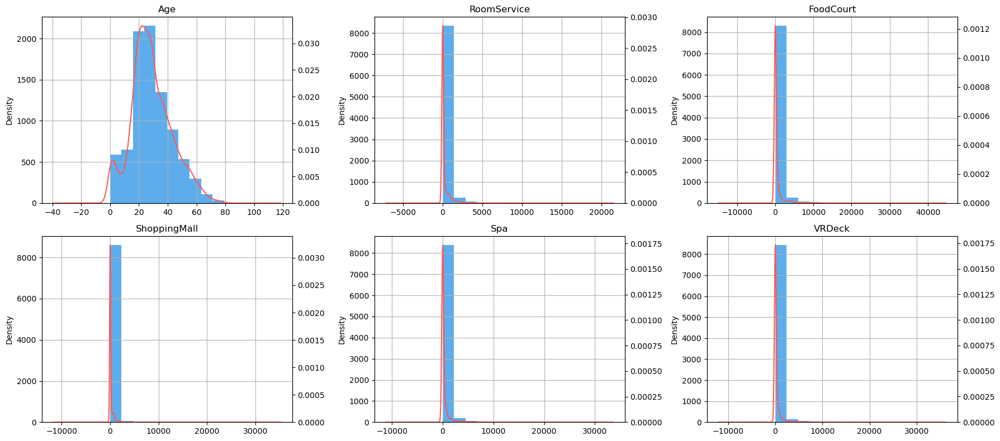

In [23]:
k = len(data_num.columns)
n = 3
m = (k - 1) // n + 1
fig, axes = plt.subplots(m, n, figsize=(n * 6, m * 4))
for i, (name, col) in enumerate(data_num.iteritems()):
    r, c = i // n, i % n
    ax = axes[r, c]
    col.hist(ax=ax, color='#5dadec')
    ax2 = col.plot.kde(ax=ax, secondary_y=True, title=name, color='#ff5757')
    ax2.set_ylim(0)

fig.tight_layout()

### Define Data Correlation

<Axes: >

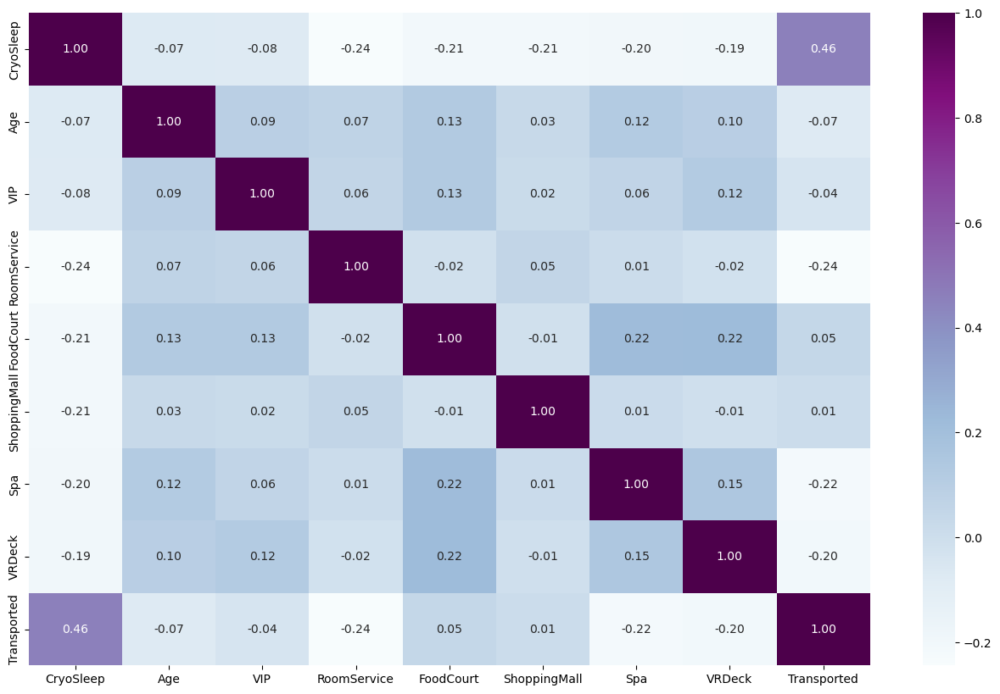

In [24]:
corr_= train_data.corr()
plt.figure(figsize=(16,10))
sns.heatmap(corr_, annot=True, fmt = ".2f", cmap = "BuPu")

From Correlation Graph above, we know:
**Passengers who use Cyro Sleep have a significant correlation value of 46% chance of surviving to their destination planet**.**Passengers who use Cyro Sleep have a significant correlation value of 46% chance of surviving to their destination planet**.

-----------------------

### Data Characteristic

#### 1. Age

In [25]:
train_data['Age'].value_counts().head().T

24.0    324
18.0    320
21.0    311
19.0    293
23.0    292
Name: Age, dtype: int64

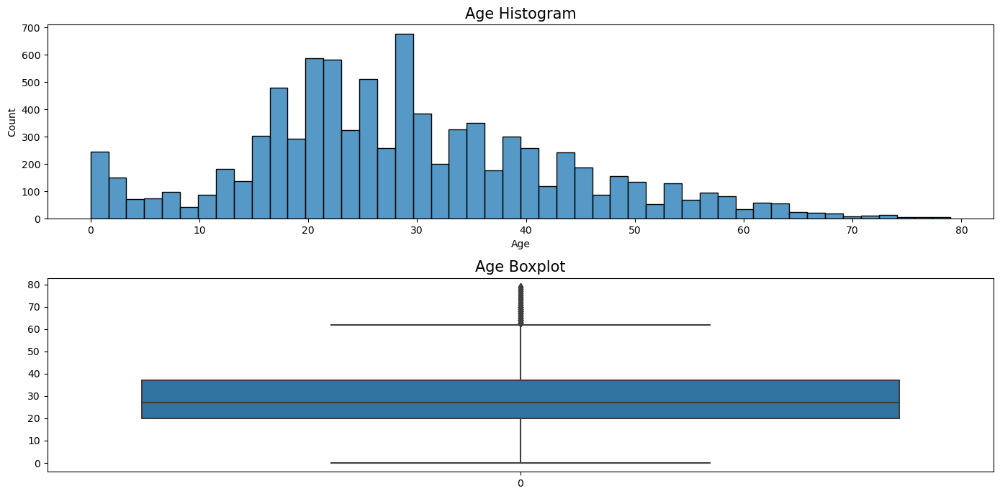

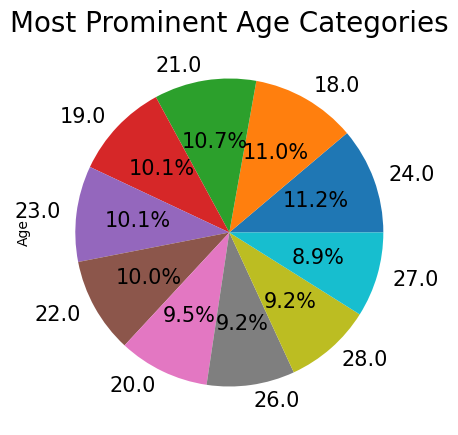

In [26]:
plt.figure(figsize=(14, 7))

plt.subplot(2, 1, 1)
sns.histplot(train_data['Age'])
plt.title("Age Histogram", fontsize=15)

plt.subplot(2, 1, 2)
sns.boxplot(train_data['Age'], orient="v")
plt.title("Age Boxplot", fontsize=15)

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
df = train_data.Age.value_counts().to_frame()
df.head(10).Age.plot(kind='pie', autopct='%1.1f%%', textprops={"fontsize":15})

plt.title("Most Prominent Age Categories", fontsize=20)
plt.show()

- The most prominent age category for Titanic Passengers was 24 years old with a dominance of 11.2% and 18 years old with a dominance of 11%.
- Passenger Id Distribution has Normal

#### 2. VIP and Transported

In [27]:
#analysing Transported column
train_data['Transported'].value_counts()

True     4378
False    4315
Name: Transported, dtype: int64

In [28]:
train_data['VIP'].value_counts()

False    8494
True      199
Name: VIP, dtype: int64

In [29]:
pd.crosstab(train_data['VIP'],train_data['Transported'])

Transported,False,True
VIP,,
False,4192,4302
True,123,76


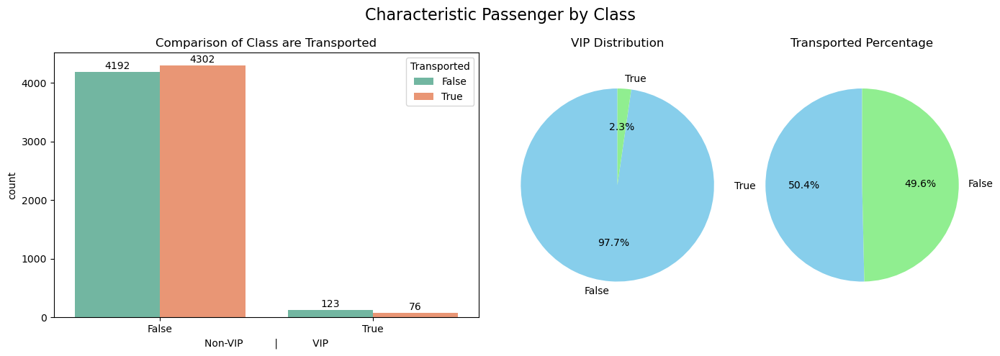

In [30]:
fig = plt.figure(figsize=(14, 5))
gs = gridspec.GridSpec(1, 3, width_ratios=[2, 1, 1])

ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])

# Countplot VIP
graph = sns.countplot(x='VIP', data=train_data, hue='Transported', palette='Set2', ax=ax1)
ax1.set_xlabel("Non-VIP          |           VIP")

for p in graph.patches:
    ax1.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()),
                   ha='center', va='bottom', color='white')
    ax1.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height() + 10),
                   ha='center', va='bottom', color='black')

ax1.set_title("Comparison of Class are Transported")

# Pie Chart VIP
vip_counts = train_data['VIP'].value_counts()
ax2.pie(vip_counts, labels=vip_counts.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgreen'])
ax2.set_title("VIP Distribution")
ax2.axis('equal')

#for i, count in enumerate(vip_counts):
#    ax2.annotate('{:.0f}'.format(count), (0, 0), (0.9 * i, 0), textcoords='axes fraction', va='center', ha='center')

# Pie Chart Transported Percentage
transported_counts = train_data['Transported'].value_counts()
ax3.pie(transported_counts, labels=transported_counts.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgreen'])
ax3.set_title("Transported Percentage")
ax3.axis('equal')

#for i, count in enumerate(transported_counts):
 #   ax3.annotate('{:.0f}'.format(count), (0, 0), (0.9 * i, 0), textcoords='axes fraction', va='center', ha='center')

plt.suptitle("Characteristic Passenger by Class", fontsize=16)
plt.tight_layout()
plt.show()

From the graph above, the percentage of Transported and Not-Transported is 50.4% (Transported: 4378) and 49.6% (Not Transported: 4315), and most passengers are non-VIP 97.7% of the 8494 passengers. In comparison, VIP is only 2.3% which are 199 passengers

#### 3. CyroSleep and Transported

In [31]:
train_data['CryoSleep'].value_counts()

False    5656
True     3037
Name: CryoSleep, dtype: int64

In [32]:
pd.crosstab(train_data['CryoSleep'],train_data['Transported'])

Transported,False,True
CryoSleep,,
False,3761,1895
True,554,2483


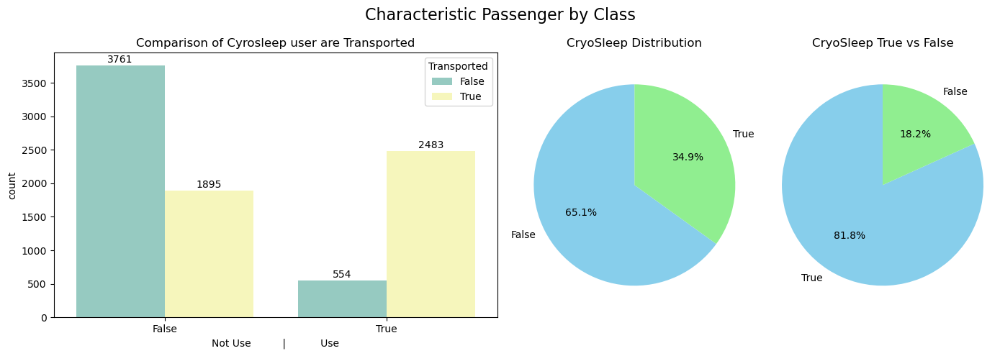

In [33]:
fig = plt.figure(figsize=(14, 5))
gs = gridspec.GridSpec(1, 3, width_ratios=[2, 1, 1])

ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])

# Countplot VIP
graph = sns.countplot(x='CryoSleep', data=train_data, hue='Transported', palette='Set3', ax=ax1)
ax1.set_xlabel("Not Use          |           Use")

for p in graph.patches:
    ax1.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()),
                   ha='center', va='bottom', color='white')
    ax1.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height() + 10),
                   ha='center', va='bottom', color='black')

ax1.set_title("Comparison of Cyrosleep user are Transported")

# Pie Chart VIP
vip_counts = train_data['CryoSleep'].value_counts()
ax2.pie(vip_counts, labels=vip_counts.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgreen'])
ax2.set_title("CryoSleep Distribution")
ax2.axis('equal')

#for i, count in enumerate(vip_counts):
#    ax2.annotate('{:.0f}'.format(count), (0, 0), (0.9 * i, 0), textcoords='axes fraction', va='center', ha='center')

# Pie Chart CryoSleep True vs False
cryosleep_counts = train_data[train_data['CryoSleep'] == True]['Transported'].value_counts()
ax3.pie(cryosleep_counts, labels=cryosleep_counts.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgreen'])
ax3.set_title("CryoSleep True vs False")
ax3.axis('equal')

#for i, count in enumerate(cryosleep_counts):
#    ax3.annotate('{:.0f}'.format(count), (0, 0), (0.9 * i, 0), textcoords='axes fraction', va='center', ha='center')

plt.suptitle("Characteristic Passenger by Class", fontsize=16)
plt.tight_layout()
plt.show()

The graph above during the trip shows, only 3037 passengers (34.9%) used Cyro sleep, and 5656 passengers (65.1%) did not use Cyrosleep. while Passengers who use Cyro Sleep during the trip the percentage is only 18.2% or 554 people from 3037 passengers who get to another dimension, so it can be concluded that the use of Cyro Sleep on this trip does not determine whether passengers will get to another dimension or not.

#### 4. Home Planet and Destination

In [34]:
train_data['HomePlanet'].value_counts()

Earth     4803
Europa    2131
Mars      1759
Name: HomePlanet, dtype: int64

In [35]:
train_data['Destination'].value_counts()

TRAPPIST-1e      6097
55 Cancri e      1800
PSO J318.5-22     796
Name: Destination, dtype: int64

In [36]:
pd.crosstab(train_data['HomePlanet'],train_data['Destination'])

Destination,55 Cancri e,PSO J318.5-22,TRAPPIST-1e
HomePlanet,,,
Earth,721,728,3354
Europa,886,19,1226
Mars,193,49,1517


In [37]:
pd.crosstab(train_data['HomePlanet'],train_data['Transported'])

Transported,False,True
HomePlanet,,
Earth,2749,2054
Europa,727,1404
Mars,839,920


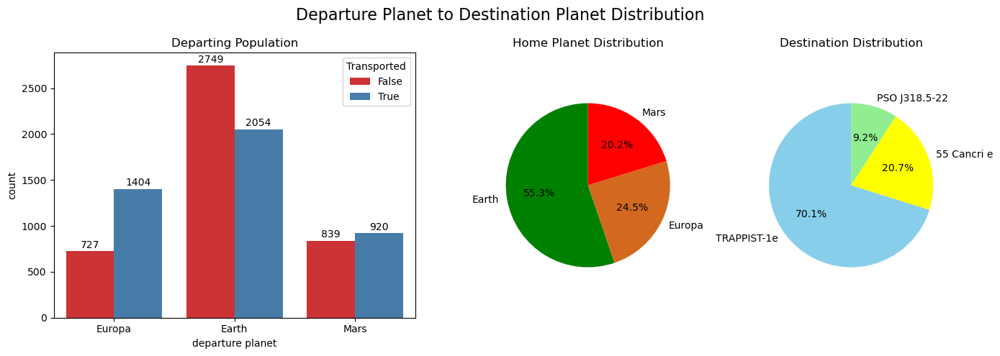

In [38]:
fig = plt.figure(figsize=(14, 5))
gs = gridspec.GridSpec(1, 3, width_ratios=[2, 1, 1])

ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])

# Countplot VIP
graph = sns.countplot(x='HomePlanet', data=train_data, hue='Transported', palette='Set1', ax=ax1)
ax1.set_xlabel("departure planet")

for p in graph.patches:
    ax1.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()),
                   ha='center', va='bottom', color='white')
    ax1.annotate('{:.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height() + 10),
                   ha='center', va='bottom', color='black')

ax1.set_title("Departing Population")

# Pie Chart VIP
vip_counts = train_data['HomePlanet'].value_counts()
ax2.pie(vip_counts, labels=vip_counts.index, autopct='%1.1f%%', startangle=90, colors=['green','chocolate','red'])
ax2.set_title("Home Planet Distribution")
ax2.axis('equal')

#for i, count in enumerate(vip_counts):
#    ax2.annotate('{:.0f}'.format(count), (0, 0), (0.9 * i, 0), textcoords='axes fraction', va='center', ha='center')

# Pie Chart Transported Percentage
transported_counts = train_data['Destination'].value_counts()
ax3.pie(transported_counts, labels=transported_counts.index, autopct='%1.1f%%', startangle=90, colors=['skyblue','yellow','lightgreen'])
ax3.set_title("Destination Distribution")
ax3.axis('equal')

#for i, count in enumerate(transported_counts):
 #   ax3.annotate('{:.0f}'.format(count), (0, 0), (0.9 * i, 0), textcoords='axes fraction', va='center', ha='center')

plt.suptitle("Departure Planet to Destination Planet Distribution", fontsize=16)
plt.tight_layout()
plt.show()

Data from the graph above during Titanic Spaceship Trip define, a passenger from Earth are Majority Population in Titanic Space Trip, which have a 55.3% (4803 Passenger) and Trappist-1e are the most favorite destination on this trip had 70.1% (6097 Passenger) of the population want migrating to there

#### 5. Luxury Amenities (Room Services, FoodCourt, Shopping Mall, Spa, and VR Deck)

In [39]:
amenities = data_num[['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']].astype(int)

passenger_spending = pd.DataFrame({'Amenities': amenities.columns,
                              'Total Spending': amenities.sum().values,
                              'Average Spending': amenities.mean().values})
passenger_spending

,Amenities,Total Spending,Average Spending
0,RoomService,1953085,224.673300
1,FoodCourt,3982051,458.075578
2,ShoppingMall,1510076,173.711722
3,Spa,2704704,311.135856
4,VRDeck,2649942,304.836305


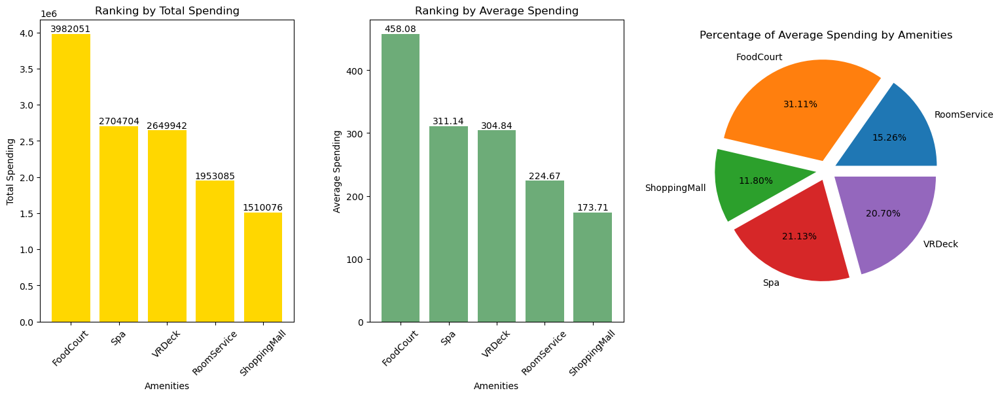

In [40]:
# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Sort total spending and average spending
total_spending_sorted = passenger_spending.sort_values('Total Spending', ascending=False)
average_spending_sorted = passenger_spending.sort_values('Average Spending', ascending=False)

# Plot Total Spending with ranking
axes[0].bar(total_spending_sorted['Amenities'], total_spending_sorted['Total Spending'], color='Gold')
axes[0].set_xlabel('Amenities')
axes[0].set_ylabel('Total Spending')
axes[0].set_title('Ranking by Total Spending')
axes[0].set_xticklabels(total_spending_sorted['Amenities'], rotation=45)
for i, value in enumerate(total_spending_sorted['Total Spending']):
    axes[0].annotate(str(value), (i, value), ha='center', va='bottom')

# Plot Average Spending with ranking
axes[1].bar(average_spending_sorted['Amenities'], average_spending_sorted['Average Spending'], color='#6dac78')
axes[1].set_xlabel('Amenities')
axes[1].set_ylabel('Average Spending')
axes[1].set_title('Ranking by Average Spending')
axes[1].set_xticklabels(average_spending_sorted['Amenities'], rotation=45)
for i, value in enumerate(average_spending_sorted['Average Spending']):
    axes[1].annotate('{:.2f}'.format(value), (i, value), ha='center', va='bottom')

# Plot Percentage
explode = [0.1] * len(passenger_spending['Amenities'])  # Set explode effect
axes[2].pie(passenger_spending['Average Spending'], labels=passenger_spending['Amenities'], autopct='%.2f%%', explode=explode)
axes[2].set_title('Percentage of Average Spending by Amenities')

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.3)

plt.show()


In [41]:
total_spending_sum = passenger_spending['Total Spending'].sum()
average_spending_sum = passenger_spending['Average Spending'].sum()

total_spending_sum_dollar = "${:,.2f}".format(total_spending_sum)
average_spending_mean_dollar = "${:,.2f}".format(average_spending_sum)

print("Total Spending Sum:", total_spending_sum_dollar)
print("Average Spending Mean:", average_spending_mean_dollar)


Total Spending Sum: $12,799,858.00
Average Spending Mean: $1,472.43


From the above graphs, it can be observed that during the Titanic Space trip, the Luxury Amenities service that passengers were most interested in was the Food Court, with a spending amount of 3,982,051 USD (31.11% from Services Revenue), followed by the Spa service with a spending amount of 2,704,704 USD (21.13 %from Services Revenue). The total revenue from Luxury Amenities services amounted to 12,799,855 USD, with an average passenger spending of 1,472 USD throughout the Titanic Spaceship trip.

-----------

# Data Preprocessing

-----------

### Feature Engineering

In [42]:
#converting categorical feature into numerical feature
train_data.HomePlanet=train_data.HomePlanet.map({'Europa':0,'Earth':1,'Mars':2})
train_data.Cabin_side=train_data.Cabin_side.map({'P':0,'S':1})

In [43]:
train_data.Destination=train_data.Destination.map({'TRAPPIST-1e':0,'PSO J318.5-22':1,'55 Cancri e':2})

In [44]:
train_data["CryoSleep"].replace(False,0,inplace=True)
train_data["CryoSleep"].replace(True,1,inplace=True)
train_data["VIP"].replace(False,0,inplace=True)
train_data["VIP"].replace(True,1,inplace=True)
train_data["Transported"].replace(False,0,inplace=True)
train_data["Transported"].replace(True,1,inplace=True)

In [45]:
train_data.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported,Cabin_side
0,0001_01,0,0,B/0/P,0,39.0,0,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,0,0
1,0002_01,1,0,F/0/S,0,24.0,0,109.0,9.0,25.0,549.0,44.0,Juanna Vines,1,1
2,0003_01,0,0,A/0/S,0,58.0,1,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,0,1
3,0003_02,0,0,A/0/S,0,33.0,0,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,0,1
4,0004_01,1,0,F/1/S,0,16.0,0,303.0,70.0,151.0,565.0,2.0,Willy Santantines,1,1


In [46]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8693 non-null   int64  
 2   CryoSleep     8693 non-null   int64  
 3   Cabin         8693 non-null   object 
 4   Destination   8693 non-null   int64  
 5   Age           8693 non-null   float64
 6   VIP           8693 non-null   int64  
 7   RoomService   8693 non-null   float64
 8   FoodCourt     8693 non-null   float64
 9   ShoppingMall  8693 non-null   float64
 10  Spa           8693 non-null   float64
 11  VRDeck        8693 non-null   float64
 12  Name          8493 non-null   object 
 13  Transported   8693 non-null   int64  
 14  Cabin_side    8693 non-null   int64  
dtypes: float64(6), int64(6), object(3)
memory usage: 1018.8+ KB


-----------------

# Modelling

-----------------

## Train test split

In [48]:
#droping unwanted columns
df1=train_data.drop(['Name','Cabin'],axis=1)

In [49]:
X = df1.drop(['Transported'],axis=1)
y = df1['Transported']
              
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df1.drop('Transported', 1), df1['Transported'], test_size = .2, random_state=0)

***Splitting the dataset into train and test datasets, 80% Train Data + 20% Test Data***

In [50]:
print(f'X_train',X_train.shape)
print(f'y_train',y_train.shape)
print(f'X_test',X_test.shape)
print(f'y_test',y_train.shape)

X_train (6954, 12)
y_train (6954,)
X_test (1739, 12)
y_test (6954,)


-----------------

# Machine Learning Model

Model Machine Learning using ****Logistic Regression ,K-Nearest Neighbors , Support Vector Classifier, Naive Bayes, Desicion Tree, and Random Foresst**** to formulation the Machine learning modelling scores to fit with Titanic Passenger Data

In [51]:
#Import Modelling Modul
import scipy.stats as stats
from sklearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score,roc_auc_score
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV,train_test_split,cross_val_score
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from scipy.stats import randint
from statsmodels.stats.outliers_influence import variance_inflation_factor


from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier


In [52]:
import sklearn.metrics as metrics
from sklearn.metrics import precision_score, recall_score, accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score


def models(models):
  results = pd.DataFrame({'accuracy_train':[],'accuracy_test':[],
                          'recall_train':[], 'recall_test':[],
                          'precision_train':[],'precision_test':[],
                          'AUC_train': [], 'AUC_test': [], 
                          'f1_score_train':[], 'f1_score_test':[]})
  

  for model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    #fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=1)
    #auc_score_train = auc(fpr, tpr)
    results = results.append({'accuracy_train': accuracy_score(y_train, model.predict(X_train)),
                              'accuracy_test': accuracy_score(y_test, model.predict(X_test)),
                              'recall_train': recall_score(y_train, model.predict(X_train), average='macro'),
                              'recall_test': recall_score(y_test, model.predict(X_test), average='macro'),
                              'precision_train': precision_score(y_train, model.predict(X_train), average='macro'),
                              'precision_test': precision_score(y_test, model.predict(X_test), average='macro'),
                              'AUC_train': roc_auc_score(y_train, model.predict(X_train)),
                              'AUC_test': roc_auc_score(y_test, model.predict(X_test)),
                              'f1_score_train': metrics.f1_score(y_train, model.predict(X_train)),
                              'f1_score_test':  metrics.f1_score(y_test, model.predict(X_test))
                              }, ignore_index=True)
    

   
  
  results['model'] = ['Logistic Regression', 'KNN','SVC','Gaussian Naive Bayes','Multinomial Naive Bayes','MLPC','Decision Tree', 'Random Forest', 'Gradient Boost']
  return results

In [53]:
models([LogisticRegression(), KNeighborsClassifier(), SVC(),GaussianNB(), MultinomialNB(), MLPClassifier(), DecisionTreeClassifier(), RandomForestClassifier(), GradientBoostingClassifier()])

,accuracy_train,accuracy_test,recall_train,recall_test,precision_train,precision_test,AUC_train,AUC_test,f1_score_train,f1_score_test,model
0,0.773080,0.775158,0.772372,0.774385,0.783829,0.787159,0.772372,0.774385,0.794478,0.797304,Logistic Regression
1,0.744895,0.629672,0.743982,0.628551,0.761282,0.641434,0.743982,0.628551,0.774702,0.679283,KNN
2,0.539114,0.550891,0.539488,0.551197,0.539914,0.551533,0.539488,0.551197,0.515788,0.533731,SVC
3,0.674001,0.658424,0.672020,0.656264,0.747925,0.735557,0.672020,0.656264,0.745367,0.736000,Gaussian Naive Bayes
4,0.734685,0.722829,0.733539,0.721507,0.760563,0.753868,0.733539,0.721507,0.772194,0.765564,Multinomial Naive Bayes
5,0.542422,0.537665,0.545506,0.540864,0.671742,0.652002,0.545506,0.540864,0.204102,0.197605,MLPC
6,1.000000,0.733755,1.000000,0.733598,1.000000,0.734068,1.000000,0.733598,1.000000,0.740616,Decision Tree
7,1.000000,0.794135,1.000000,0.794278,1.000000,0.794600,1.000000,0.794278,1.000000,0.791375,Random Forest
8,0.818234,0.795285,0.818028,0.795007,0.819232,0.796832,0.818028,0.795007,0.824298,0.803749,Gradient Boost


-----------------

## Model Evaluation

In [54]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

### Cross Validation

In [55]:
scores = cross_val_score(rf, X_train, y_train, cv=5)
print('Cross-Validation Accuracy Scores', scores)
print('Cross-Validation Accuracy Scores', scores.mean())

Cross-Validation Accuracy Scores [0.79439252 0.76347951 0.79079799 0.78576564 0.77625899]
Cross-Validation Accuracy Scores 0.7821389301211797


***Cross-Validation Accuracy Scores is 0.782 or 78 %***

### Hyperparamater Tuning

In [58]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
import numpy as np

param_grid = [
{'criterion':['gini', 'entropy'],'n_estimators': [25, 50, 100], 'max_features': ['auto', 'log2'], 
'max_depth': [25, 50, 100],
'min_samples_split':[2, 5, 10], 'min_samples_leaf':[4, 8, 16], 'bootstrap': [True, False]}
 ]

rf = RandomForestClassifier(random_state=0)

grid_search_forest = GridSearchCV(rf, param_grid, cv=5)
grid_search_forest.fit(X_train, y_train)

grid_search_forest.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=25, max_features='auto',
                       min_samples_leaf=16, random_state=0)

In [59]:
rf = RandomForestClassifier(criterion='entropy', max_depth=25, max_features='auto',
                       min_samples_leaf=16, random_state=0)

rf.fit(X_train,y_train)
rf_predicted = rf.predict(X_test)
rf_conf_matrix = confusion_matrix(y_test, rf_predicted)
rf_acc_score = accuracy_score(y_test, rf_predicted)

print("confussion matrix")
print(rf_conf_matrix)
print("\n")
print("Accuracy of Random Forest:",rf_acc_score*100,'\n')
print(classification_report(y_test,rf_predicted))

confussion matrix
[[653 210]
 [142 734]]


Accuracy of Random Forest: 79.75848188614147 

              precision    recall  f1-score   support

           0       0.82      0.76      0.79       863
           1       0.78      0.84      0.81       876

    accuracy                           0.80      1739
   macro avg       0.80      0.80      0.80      1739
weighted avg       0.80      0.80      0.80      1739



After Hyperparameter tuning accuracy value of  ***Random Forest*** Algorithm is 79.76%, with precision 82% / 78%, recall 76 % / 84 %, f1-score 79 % / 81 % , Macro and weight average is 80% with total accuracy support 1739 and each support is 863 / 876

-----

## Feature Importance

Text(0.5, 1.0, 'feature importance score')

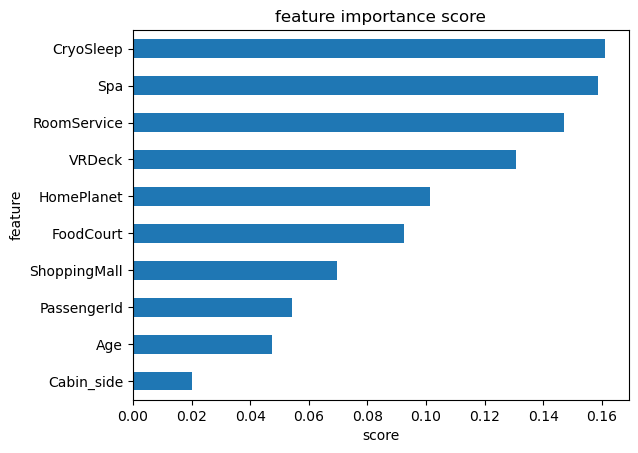

In [60]:
feat_importances = pd.Series(rf.feature_importances_, index=X.columns)
ax = feat_importances.nlargest(10).plot(kind='barh')
ax.invert_yaxis()
plt.xlabel('score')
plt.ylabel('feature')
plt.title('feature importance score')

Feature Importance that influent passengers can Transported to another dimension with the Titanic Spaceship is:

- Cyro Sleep
- Spa
- Room Service 
- VR Deck
- Home Planet

The Feature Importance is the Luxury Amenities services (Top 4 in Importance of Features), and the Home Planet where the passengers come from, which are important factors for a Journey of Titanic Spaceship passengers to arrive at the destination planet.

-----------------

## Permutation Importance

In [61]:
import eli5 
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(grid_search_forest.best_estimator_, random_state=0).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X.columns.to_list())

Weight,Feature
0.0611 ± 0.0070,CryoSleep
0.0411 ± 0.0014,FoodCourt
0.0397 ± 0.0093,VRDeck
0.0329 ± 0.0090,Spa
0.0324 ± 0.0111,RoomService
0.0055 ± 0.0028,Cabin_side
0.0053 ± 0.0047,PassengerId
0.0052 ± 0.0053,ShoppingMall
0.0048 ± 0.0040,Age
0.0048 ± 0.0058,HomePlanet


The table above is an influential feature in the experiment that Passenger who succeede Transported by Titanic Spaceship, including:
- Cyro Sleep
- Food Court
- VR Deck
- Room Service
- Spa

------

## Random Forest tree classifier

In [62]:
from sklearn.tree import export_graphviz
estimator = grid_search_forest.best_estimator_[5]
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X.columns,
                class_names = ['no Transported','Transported'],
                rounded = True, proportion = True, 
                precision = 3, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

-----------------------------

------

------

# Analysis Summary

The research was conducted to predict the factors and causes of Titanic passengers arriving at the planet's destination. The modeling performed includes ***Logistic Regression, Naive Bayes (Gaussian & Multinomial), Support Vector Machine, K-Nearest Neighbors, Multi Perceptron Classifier, Decision Tree, Random Forest, and Gradient Boost***. The results of the above modeling show that ***Decision Tree and Random Forest*** have the most significant numbers of all modeling algorithms performed. Furthermore, the author conducts further evaluation by using ***Random Forest*** for this study. because it is more in line with the dataset in predicting and knowing the factors of Titanic spaceship passengers can get to the destination planet. By using the *Permutation Importance and SHAP* methods, it is known that the entire sample shows *****Luxury Amenities (Room Services, Food Court, Spa, Shopping Mall, and VR Deck***** which are life-supporting factors for passengers to get to their destination, and from these *****Luxury Amenities***** also the revenue generated is 12,799,858 USD, with an average expenditure per passenger of 1,472 USD during the Titanic starship trip. It is also known that only some passengers (50.4%) reached the destination planet, this may be due to age, the length of the space journey, or even other factors that affect passengers being able to reach the destination planet. We don't fully know what happened, we can only predict through machine learning and the probability is not absolute.

------

------

# Submission Test Data

In [136]:
testing = pd.read_csv("test.csv")
testing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4277 entries, 0 to 4276
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   4277 non-null   object 
 1   HomePlanet    4190 non-null   object 
 2   CryoSleep     4184 non-null   object 
 3   Cabin         4177 non-null   object 
 4   Destination   4185 non-null   object 
 5   Age           4186 non-null   float64
 6   VIP           4184 non-null   object 
 7   RoomService   4195 non-null   float64
 8   FoodCourt     4171 non-null   float64
 9   ShoppingMall  4179 non-null   float64
 10  Spa           4176 non-null   float64
 11  VRDeck        4197 non-null   float64
 12  Name          4183 non-null   object 
dtypes: float64(6), object(7)
memory usage: 434.5+ KB


In [137]:
testing.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name
0,0013_01,Earth,True,G/3/S,TRAPPIST-1e,27.0,False,0.0,0.0,0.0,0.0,0.0,Nelly Carsoning
1,0018_01,Earth,False,F/4/S,TRAPPIST-1e,19.0,False,0.0,9.0,0.0,2823.0,0.0,Lerome Peckers
2,0019_01,Europa,True,C/0/S,55 Cancri e,31.0,False,0.0,0.0,0.0,0.0,0.0,Sabih Unhearfus
3,0021_01,Europa,False,C/1/S,TRAPPIST-1e,38.0,False,0.0,6652.0,0.0,181.0,585.0,Meratz Caltilter
4,0023_01,Earth,False,F/5/S,TRAPPIST-1e,20.0,False,10.0,0.0,635.0,0.0,0.0,Brence Harperez


In [138]:
#checking the no of null values in the dataset
testing.isnull().sum().sort_values(ascending=False)

FoodCourt       106
Spa             101
Cabin           100
ShoppingMall     98
Name             94
CryoSleep        93
VIP              93
Destination      92
Age              91
HomePlanet       87
RoomService      82
VRDeck           80
PassengerId       0
dtype: int64

In [139]:
#filling null values with mean in numerical columns

testing['Age']=testing['Age'].fillna(testing['Age'].mean())
testing['RoomService']=testing['RoomService'].fillna(testing['RoomService'].mean())
testing['FoodCourt']=testing['FoodCourt'].fillna(testing['FoodCourt'].mean())
testing['ShoppingMall']=testing['ShoppingMall'].fillna(testing['ShoppingMall'].mean())
testing['Spa']=testing['Spa'].fillna(testing['Spa'].mean())
testing['VRDeck']=testing['VRDeck'].fillna(testing['VRDeck'].mean())

In [141]:
#filling null values with mode in categorical columns

testing['HomePlanet']=testing['HomePlanet'].fillna(testing['HomePlanet'].mode()[0])
testing['CryoSleep']=testing['CryoSleep'].fillna(testing['CryoSleep'].mode()[0])
testing['Destination']=testing['Destination'].fillna(testing['Destination'].mode()[0])
testing['VIP']=testing['VIP'].fillna(testing['VIP'].mode()[0])
testing['Cabin']=testing['Cabin'].fillna(testing['Cabin'].mode()[0])

In [142]:
testing.isnull().sum().sort_values(ascending=False)

Name            94
PassengerId      0
HomePlanet       0
CryoSleep        0
Cabin            0
Destination      0
Age              0
VIP              0
RoomService      0
FoodCourt        0
ShoppingMall     0
Spa              0
VRDeck           0
dtype: int64

In [145]:
testing.Cabin.value_counts()

G/160/P     108
G/748/S       7
E/228/S       7
D/273/S       7
B/31/P        7
           ... 
E/236/S       1
F/650/S       1
G/566/P       1
G/557/S       1
G/1498/S      1
Name: Cabin, Length: 3265, dtype: int64

In [146]:
testing['Cabin_side'] = testing['Cabin'].apply(lambda x: x.split('/')[2])
testing['Cabin_side'].unique()

array(['S', 'P'], dtype=object)

P - cabin side Port ; S - cabin side Starboard

## Feature Engineering of test Submisson

In [130]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4277 entries, 0 to 4276
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   4277 non-null   object 
 1   HomePlanet    4277 non-null   int64  
 2   CryoSleep     4277 non-null   bool   
 3   Cabin         4277 non-null   object 
 4   Destination   4277 non-null   object 
 5   Age           4277 non-null   float64
 6   VIP           4277 non-null   bool   
 7   RoomService   4277 non-null   float64
 8   FoodCourt     4277 non-null   float64
 9   ShoppingMall  4277 non-null   float64
 10  Spa           4277 non-null   float64
 11  VRDeck        4277 non-null   float64
 12  Name          4183 non-null   object 
 13  Cabin_side    4277 non-null   int64  
dtypes: bool(2), float64(6), int64(2), object(4)
memory usage: 409.4+ KB


In [150]:
testing["CryoSleep"].replace(False,0,inplace=True)
testing["CryoSleep"].replace(True,1,inplace=True)
testing["VIP"].replace(False,0,inplace=True)
testing["VIP"].replace(True,1,inplace=True)

In [149]:
#converting categorical feature into numerical feature
testing.HomePlanet=testing.HomePlanet.map({'Europa':0,'Earth':1,'Mars':2})
testing.Cabin_side=testing.Cabin_side.map({'P':0,'S':1})
testing.Destination = testing.Destination.map({'TRAPPIST-1e': 0, 'PSO J318.5-22': 1, '55 Cancri e': 2})

In [152]:
testing.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Cabin_side
0,0013_01,1,1,G/3/S,0,27.0,0,0.0,0.0,0.0,0.0,0.0,Nelly Carsoning,1
1,0018_01,1,0,F/4/S,0,19.0,0,0.0,9.0,0.0,2823.0,0.0,Lerome Peckers,1
2,0019_01,0,1,C/0/S,2,31.0,0,0.0,0.0,0.0,0.0,0.0,Sabih Unhearfus,1
3,0021_01,0,0,C/1/S,0,38.0,0,0.0,6652.0,0.0,181.0,585.0,Meratz Caltilter,1
4,0023_01,1,0,F/5/S,0,20.0,0,10.0,0.0,635.0,0.0,0.0,Brence Harperez,1


In [155]:
#droping unwanted columns
test_df=testing.drop(['Name','Cabin'],axis=1)

In [156]:
test_df.head()

,PassengerId,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Cabin_side
0,0013_01,1,1,0,27.0,0,0.0,0.0,0.0,0.0,0.0,1
1,0018_01,1,0,0,19.0,0,0.0,9.0,0.0,2823.0,0.0,1
2,0019_01,0,1,2,31.0,0,0.0,0.0,0.0,0.0,0.0,1
3,0021_01,0,0,0,38.0,0,0.0,6652.0,0.0,181.0,585.0,1
4,0023_01,1,0,0,20.0,0,10.0,0.0,635.0,0.0,0.0,1


In [157]:
#checking null values
test_df.isnull().sum()

PassengerId     0
HomePlanet      0
CryoSleep       0
Destination     0
Age             0
VIP             0
RoomService     0
FoodCourt       0
ShoppingMall    0
Spa             0
VRDeck          0
Cabin_side      0
dtype: int64

-----

-----

# Final Prediction Submission

In [158]:
#final prediction we use the Random Forest Classifier with 80% accuracy
pred_final=rf.predict(test_df)

In [159]:
a=test_df['PassengerId']
x=pd.DataFrame(a)
b=pred_final
y=pd.DataFrame(b)

In [160]:
final=pd.concat([x,y],axis=1)
final.replace(0,False,inplace=True)
final.replace(1,True,inplace=True)
final.rename(columns={0:'Transported'},inplace=True)
final

,PassengerId,Transported
0,0013_01,True
1,0018_01,False
2,0019_01,True
3,0021_01,True
4,0023_01,False
...,...,...
4272,9266_02,True
4273,9269_01,False
4274,9271_01,True
4275,9273_01,True


In [162]:
final.to_csv('spaceship_titanic_predict.csv',index=False)

<Axes: xlabel='Transported', ylabel='count'>

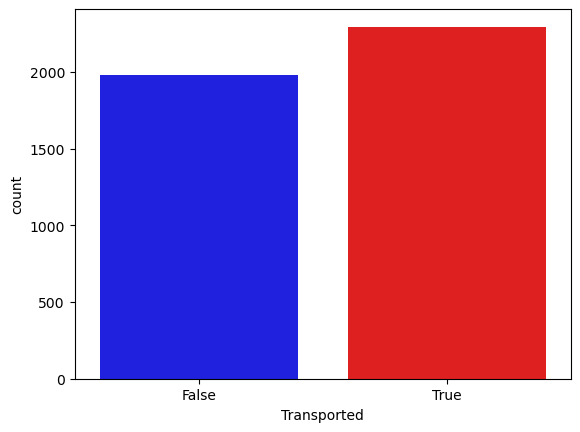

In [163]:
#visualizing predicted values
sns.countplot(x='Transported',data=final,palette=['b','r'])